# MSc Masters Research 2026 

Msc Geoinformation Technology & Cartography 2026 

May 2026 - September 2026 

Student: 3098809t 

Supervisor: Dr Joshua Franz Einsle

# Introduction to notebook 02

This notebook is the 2nd of 2 notebooks in the study.

Notebook 02 demonstrates a Principal Component Analysis (PCA) applied to a clipped Region of Interest (ROI) at Wheal Maid, Cornwall, UK of temporal window 02 (Gorse) and utilises a 'stack' of vegetation indicies to assess whether an unsupervised method can identify patterns associated with plant species colonising the site.

The aim of this notebook is to provide a reproducible workflow that can be applied to other Regions of Interest across Cornwall, Devon, and the UK. 



# Area of Interest 

Wheal Maid, Cornwall UK 

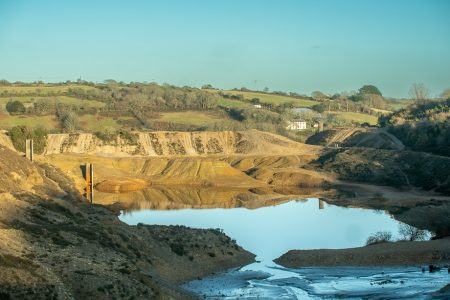


Source: https://www.gwennap-pc.gov.uk/wheal-maid/ 

Accessed August 25, 2026 

Wheal Maid is a disused tailings facility with 3 dams. The water levels change with seasonal shifts

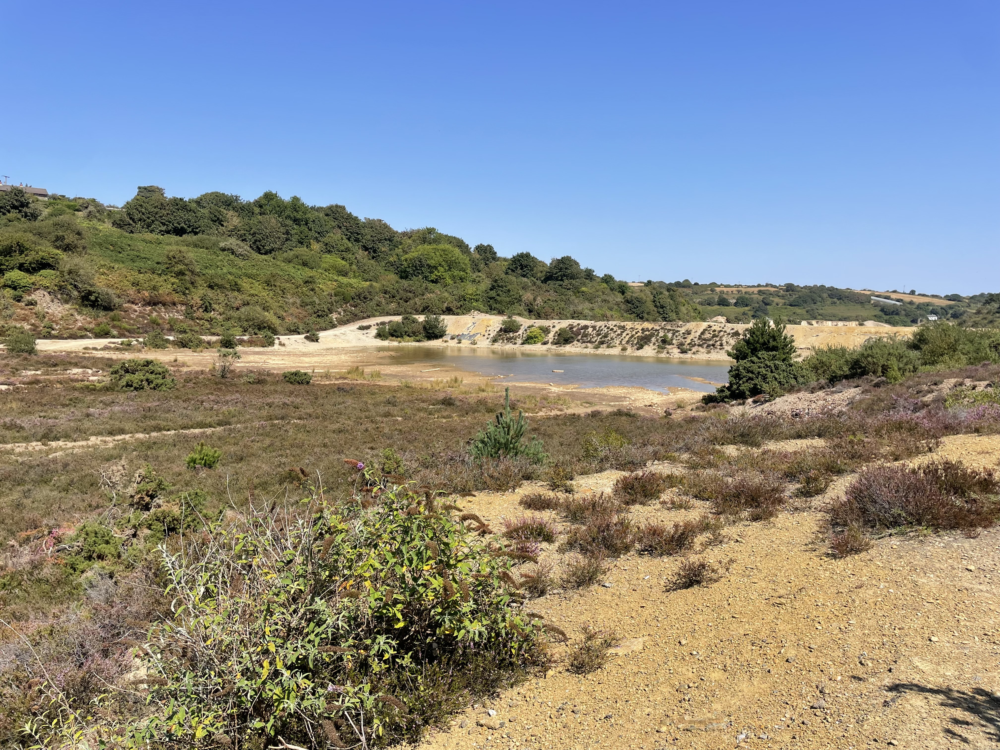

Source: M Taylor 

August 12, 2026 

# Load libraries

In [ ]:
import numpy as np
import pandas as pd

import hyperspy.api as hs
import sklearn
import skimage as ski

from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.collections import PolyCollection
import pathlib
import imageio.v3 as iio
from cmcrameri import cm

import os


#**note** this next bit is to hide warning due to upcoming changes to libaries which are not critical for the course
import warnings
# Suppress FutureWarning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Setting up figure folder 

In [ ]:
folder = "Figures_Gorse"
os.makedirs(folder, exist_ok=True)

# Sentinel 2-A temporal analysis 2018 - 2026 

## build vegetation-index matrix for heather temporal window 

// Set date range

    Gorse Window: {
    startMonth: 4,
    startDay: 1,
    endMonth: 5,
    endDay: 31
  },
};

// Set temporal year range

var startYear = 2018;
var endYear = 2026;



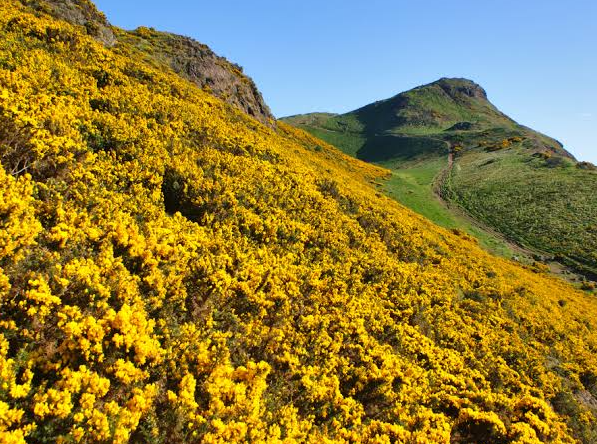

### Loading in images 

Note: 

- For a typical workflow others may use rioxarray here (instead of 'iio.') but was having trouble working around the university proxy.
- Rioxarray or gdal is a better method for handling geotiffs and the x and y coordinates are generated automatically from the file’s geoinformation and refer to the center of the pixel.
- Whereas I have had to use image io and will then georeference into ArcGIS instead.
- User to change file path to suit

In [ ]:
GORSE_path = pathlib.Path("/home/3098809t/Wheal Maid/Sen2A_Data/GORSE")

GORSE_images = {}

print(f"Scanning folder: {GORSE_path.resolve()}\n")

GORSE_files = sorted(GORSE_path.glob("*.tif"))

print(f"Found {len(GORSE_files)} files\n")

for gorse_file in GORSE_files:
    try:
        # Pillow backend avoids the imagecodecs requirement
        arr = iio.imread(gorse_file, plugin="pillow").astype(np.float32)

        # Ensure 2D (some TIFFs may be 1×H×W)
        if arr.ndim == 3:
            arr = arr[0]

        name = gorse_file.stem
        
        GORSE_images[name] = arr

    except Exception as e:
        print(f"Error loading {gorse_file.name}: {e}\n")

print(f"Done! Successfully loaded {len(GORSE_images)} images.")


In [ ]:
records = []

for name, arr in GORSE_images.items():

    parts = name.split("_")

    index_name = parts[0]
    year = int(parts[2])

    flat = arr.flatten()

    for pixel_id, value in enumerate(flat):

        records.append(
            {
                "year": year,
                "pixel_id": pixel_id,
                "index": index_name,
                "value": value,
            }
        )

gorse_long_df = pd.DataFrame(records)

print("\nLong format:")
print(gorse_long_df.head(10))

In [ ]:
gorse_df = (
    gorse_long_df
    .pivot_table(
        index=["year", "pixel_id"],
        columns="index",
        values="value"
    )
    .reset_index()
)

print(gorse_df.head(10))

In [ ]:
gorse_df.shape

## check for NaN values in the stack

In [ ]:
veg_index = ['GCI', 'GNDVI', 'MARI', 'NDMI', 'NDVI', 'NDYI', 'PSRI', 'RDVI', 'SAVI']
veg_index

In [ ]:
gorse_df[veg_index].describe().loc[['mean', 'std', 'min', 'max']]

In [ ]:
gorse_df[veg_index].isna().sum()

In [ ]:
print(gorse_df.shape)

## check for min and max values in the stack

In [ ]:
gorse_df[veg_index].describe().loc[['mean', 'std', 'min', 'max']]


In [ ]:
yearly_stats = (gorse_df
    .groupby('year')[veg_index]
    .agg(['mean', 'std', 'min', 'max'])
    .stack()
    .stack()
    .reset_index(name='value')
)

yearly_stats.columns = ['year', 'stat', 'index', 'value']

In [ ]:
yearly_stats

In [ ]:
plt.figure(figsize = (10,6)) 

sns.lineplot(
    data= yearly_stats[yearly_stats['stat']=='mean'],
    x='year',
    y= 'value',
    hue = 'index',
    marker='o'
)

plt.title('Yearly Mean Values for Vegetation Indices 2018 - 2026')
plt.xlabel("Year")
plt.ylabel("Mean Value")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
gorse_df[veg_index].describe().loc[['mean', 'std', 'min', 'max']]

### a note on GCI values

- GCI values are higher than what Ali, A. 2019 https://doi.org/10.3390/rs11202384 state
- "The estimation of chlorophyll concentration at leaf canopy involves the Green Chlorophyll Index (GCI).. It ranges from 0 to 6"
- the high values may be contributed from stress in the environment or mineral composition of tailings

Refer to dissertation for further information / potential limitation

## Plot Vegetation Indexes

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(15, 12))

for ax, index in zip(axes.flat, veg_index):
    ax.hist(gorse_df[index], bins=100)
    ax.set_title(index)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


# Prepare Principal Component Analysis (PCA) input

In [ ]:
metadata = gorse_df[
    ["year", "pixel_id"]
].copy()

X = gorse_df.drop(
    columns=[
        "year",
        "pixel_id"
    ]
)

print("\nPCA variables:")
print(X.columns.tolist())

In [ ]:
X

# Standardize data 

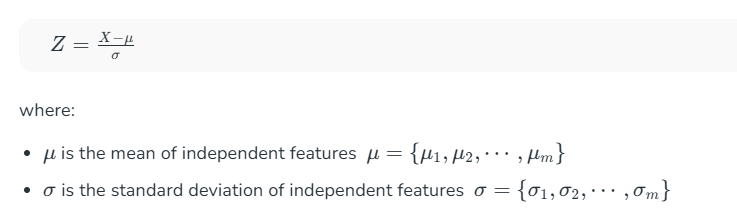

## A note on standardising data 

Standardization sets the mean of each feature to 0 and the standard deviation to 1. 
- This means each variable is equally scaling the principal components and no index is dominating 
- While the indexs used in this study value range from -1 to 1. There are other indices that exist that may have a different value range. 

In [ ]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [ ]:
type (X_scaled) 

In [ ]:
X_scaled

# Apply PCA

In [ ]:
n_components = 9 

- 9 indices so will use it as the base

## Calculate Loadings & Variance explained for each PC 

- indicate the contribution of the variables to each PC 

In [ ]:
pca = PCA(n_components=9)

# transformed observations
loadings = pca.fit_transform(X_scaled)

print("\nExplained variance ratio:")

cumulative = 0 

for i, var in enumerate(
    pca.explained_variance_ratio_
):

    #sigma

    sd = pca.singular_values_[i] / ((X_scaled.shape[0] - 1) ** 0.5)

    #cumulative proportion 

    cumulative += var

    print(
        f"PC{i+1}: {var*100:.2f}%", #proportion 
        
        f"sigma = {sd:.2f}, "
        
        f"Cumulative = {cumulative*100:.2f}%"
    )

## Plot Scree Plots

- Scree plots are used to show the eigenvalues. 

- These are used to tell us how important the principal components are and how much variance (or information) is explained with each principal component. 
    
- Therefore, a scree plot helps to determine how many components are necessary to explain the data 

In [ ]:
scree_plot = plt.figure(figsize=(20, 6))

ax = plt.subplot(1, 2, 2)

plt.plot(np.arange(1,X.shape[1]+1), pca.explained_variance_ratio_.cumsum(), \
          marker='o', markersize=5, linestyle = 'dashed', color='k', label='Cumulative variance')
plt.plot(np.arange(1,X.shape[1]+1), pca.explained_variance_ratio_, \
          marker='o', markersize=5, color='k', label='Variance')
plt.xlabel('number of PCs')
plt.ylabel('proportion of variance explained')
plt.xticks(np.arange(1,X.shape[1]+1,1))
plt.ylim(0,1.1)
plt.legend()
plt.title('Scree plot: Relative variance')

scree_plot.savefig(
    os.path.join(folder, "Gorse Scree Plot Relative Variance"),
    dpi=300,
    bbox_inches="tight"
)

Based on the explained variance ratio and the scree plot 

PC1: 80.92% 

PC2: 8.31% 

PC3: 5.57% 

PC1, 2 and 3 combined capture 94.8% of the variance 

## No. of PC chosen for further calculation

In [ ]:
n_components = 3

In [ ]:
index_list = X.columns


In [ ]:
type(index_list)

In [ ]:
loadings_plot = plt.figure(figsize=(20,12))

for i in range(n_components):
    plt.subplot(2,2,i+1)
    plt.bar(index_list, pca.components_[i], color='k', linewidth=0.5, width=0.6)
    plt.hlines(y=0, xmin=-1, xmax=len(index_list))
    plt.ylabel('PC loadings')
    plt.title('PC'+str(i+1)+' ({:.1f}%)'.format(100*pca.explained_variance_ratio_[i]))
    plt.xticks(rotation=45)
    plt.xlim(-0.6, len(index_list)-0.4)

loadings_plot.savefig(
    os.path.join(folder,"Gorse Loadings Plot PC1 PC2 PC3"),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plots show which variables are influencial for each PC loading 


## Comments on graphs & subplots

PC2 PSRI + NYDI + MARI dominating, lower NDMI, NDVI 
- this PC is showing high NYDI AND PSRI values 
- NYDI capturing vegetation types 
- signs of stress 

PC3 lower SAVI, RDVI PSRI NYDI and higher MARI GNDVI GCI 
- non vegetated areas, capturing water bodies
- higher MARI potentially capturing heather species
- bare soil
- signs of stress 


In [ ]:
loadings_df = pd.DataFrame(
    data=loadings,
    columns=[f"PC {i}" for i in range(1, 10)]
)

loadings_df = loadings_df[["PC 1", "PC 2", "PC 3"]]

print(loadings_df)

In [ ]:
loadings_df

## Pairplot of PC1 PC2 PC3

In [ ]:
plt.figure()
sns.pairplot(data=loadings_df[['PC 1','PC 2','PC 3']])

## Adding PC into metadata dataframe

In [ ]:
for i in range(loadings.shape[1]):

    metadata[f"PC{i+1}"] = loadings[:, i]

## subset metadata dataframe here to use for other plots 

In [ ]:
subset_meta= pd.concat([metadata, X], axis=1)

subset_meta

## warning -- slow plot next 

## PC1 V PC2 & PC1 V PC3 & PC2 V PC3 PLOTS for different vegetation indices 

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.scatterplot(data=subset_meta, x='PC1', y='PC2',
                hue='NDVI', palette='viridis', alpha=0.6, s=10, ax=axes[0])

sns.scatterplot(data=subset_meta, x='PC1', y='PC3',
                hue='NDVI', palette='viridis', alpha=0.6, s=10, ax=axes[1])

sns.scatterplot(data=subset_meta, x='PC2', y='PC3',
                hue='NDVI', palette='viridis', alpha=0.6, s=10, ax=axes[2])

plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.scatterplot(data=subset_meta, x='PC1', y='PC2',
                hue='NDYI', palette='viridis', alpha=0.6, s=10, ax=axes[0])

sns.scatterplot(data=subset_meta, x='PC1', y='PC3',
                hue='NDYI', palette='viridis', alpha=0.6, s=10, ax=axes[1])

sns.scatterplot(data=subset_meta, x='PC2', y='PC3',
                hue='NDYI', palette='viridis', alpha=0.6, s=10, ax=axes[2])

plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.scatterplot(data=subset_meta, x='PC1', y='PC2',
                hue='SAVI', palette='viridis', alpha=0.6, s=10, ax=axes[0])

sns.scatterplot(data=subset_meta, x='PC1', y='PC3',
                hue='SAVI', palette='viridis', alpha=0.6, s=10, ax=axes[1])

sns.scatterplot(data=subset_meta, x='PC2', y='PC3',
                hue='SAVI', palette='viridis', alpha=0.6, s=10, ax=axes[2])

plt.tight_layout()
plt.show()

# Raster image variables 

- this will be used throughout to map clusters 

In [ ]:
HEIGHT = 93
WIDTH = 161

In [ ]:
type(HEIGHT)

# Store PCA scores = loadings (weights)

In [ ]:
components_df = pd.DataFrame(
    pca.components_.T,
    columns=[
        f"PC{i + 1}"
        for i in range(pca.n_components_)
    ],
    index=X.columns
)

print("\nComponents / Factors")
print(components_df)

#### Components csv file

In [ ]:
components_df.to_csv("GORSE_PCA_components.csv")

#### Plot of components (scores) for all PC

In [ ]:
PCA_all_com = plt.figure (figsize = (8,6)) 

sns.heatmap (components_df, 
             annot=True,
             fmt=".2f", 
             cmap=cm.hawaii,
             center=0) 

plt.xlabel("Principal Components")
plt.ylabel("Variables") 
plt.title("PCA Component Loadings (all")

PCA_all_com.figure.savefig(
    os.path.join(folder,"GORSE_PCA_all_com.png"),
    dpi=300,
    bbox_inches="tight")


plt.tight_layout()
plt.show()


#### Plot of components (scores) for PC1 PC2 PC3

In [ ]:
PCA_subset = plt.figure (figsize = (8,6)) 

subset_com = components_df.iloc[:, :3]


sns.heatmap (subset_com, 
             annot=True,
             fmt=".2f", 
             cmap=cm.hawaii,
             xticklabels=['PC1', 'PC2','PC3'],
             center=0) 

plt.xlabel("Principal Components")
plt.ylabel("Variables") 
plt.title("PCA Component Loadings (PC1 - PC3)")

PCA_subset.figure.savefig(
    os.path.join(folder,"GORSE_PCA_subset_com.png"),
    dpi=300,
    bbox_inches="tight")


plt.tight_layout()
plt.show()


# Maps for PC loadings

## 2018 Map 

In [ ]:
# Available years
years = sorted(subset_meta["year"].unique())

# --------------------------------------------------
# Loading maps
# --------------------------------------------------

loading_maps = {}

for pc in range(1, 4):

    pc_name = f"PC{pc}"

    loading_maps[pc_name] = {}

    for yr in years:

        # Select data for this year
        subset = subset_meta[
            subset_meta["year"] == yr
        ]

        # Create an empty full-size raster
        loading_map = np.full(
            HEIGHT * WIDTH,
            np.nan
        )

        # Insert loading values at their pixel locations
        loading_map[
            subset["pixel_id"].values
        ] = subset[pc_name].values

        # Convert to 2D raster
        loading_map = loading_map.reshape(
            HEIGHT,
            WIDTH
        )

        loading_maps[pc_name][yr] = loading_map


# --------------------------------------------------
# Plot single loading map
# --------------------------------------------------

yr_18 = 2018

loadingmap_18 = plt.figure (figsize = (8,6)) 

plt.imshow(
    loading_maps["PC1"][yr_18],
    cmap=cm.hawaii
)

plt.colorbar(label="Loading")

plt.title(
    f"PC1 Loadings: {yr_18}"
)

loadingmap_18.savefig(
    os.path.join(folder,"PC1 Loadings 2018 for Gorse Window"), 
    dpi=300, 
    bbox_inches="tight")

plt.show()

In [ ]:
type(loading_maps)

## Plot all 3 PCs (PC1 PC2 PC3) for all years (2018 - 2026) 


In [ ]:
fig, axes = plt.subplots(
    nrows=len(years),
    ncols=3,
    figsize=(10, 2 * len(years)),
    constrained_layout=True
)

for row, yr in enumerate(years):

    for pc in range(1, 4):

        ax = axes[row, pc - 1]

        im = ax.imshow(
            loading_maps[f"PC{pc}"][yr],
            cmap=cm.hawaii
        )

        ax.set_xticks([])
        ax.set_yticks([])

        if row == 0:
            ax.set_title(f"PC{pc}")

        if pc == 1:
            ax.set_ylabel(str(yr))


# Shared colourbar
cbar = fig.colorbar(
    im,
    ax=axes,
    shrink=0.8,
    pad=0.01
)

cbar.set_label("Loading")

fig.suptitle("PCA Loading Maps by Year",
    fontsize=16)

fig.savefig(
    os.path.join(folder,"PCA Loading Maps by Year for Gorse Window"), 
    dpi=300, 
    bbox_inches="tight")

plt.show()

## 2025 Map 

In [ ]:
# --------------------------------------------------
# Plot single loading map
# --------------------------------------------------

yr_25 = 2025

loadingmap_25 = plt.figure (figsize = (8,6)) 

plt.imshow(loading_maps["PC1"][yr_25],cmap=cm.hawaii)

plt.colorbar(label="Loading")

plt.title(
    f"PC1 Loadings: {yr_25}"
)

loadingmap_25.savefig(
    os.path.join(folder,"PC1 Loadings 2025 for Gorse Window"), 
    dpi=300, 
    bbox_inches="tight")

plt.show()

# Individual year analysis 

In [ ]:
subset_meta

In [ ]:
veg_index

In [ ]:
subset_meta.columns

In [ ]:
subset_meta.groupby('year')[veg_index].agg(['min', 'max'])



# GMM analysis 

## A note on GMM 

## prepare data for GMM 

In [ ]:
loadings_df

In [ ]:
X_pca = loadings_df

In [ ]:
X_pca.shape


In [ ]:
type(X_pca)

# GMM loop 

## loop for components up to 30 

In [ ]:
print(GORSE_images.keys())

In [ ]:
ref_ndvi = 'NDVI_GorseWindow_2023'

plt.figure(figsize=(10, 8))
plt.imshow(GORSE_images[ref_ndvi])
plt.title(ref_ndvi)
plt.axis('off')
plt.show()


In [ ]:
ref_savi = 'SAVI_GorseWindow_2023'

plt.figure(figsize=(10, 8))
plt.imshow(GORSE_images[ref_savi])
plt.title(ref_savi)
plt.axis('off')
plt.show()


In [ ]:
ref_ndyi = 'NDYI_GorseWindow_2023'

plt.figure(figsize=(10, 8))
plt.imshow(GORSE_images[ref_ndyi])
plt.title(ref_ndyi)
plt.axis('off')
plt.show()


In [ ]:
bics = []
aics = []

cluster_px = np.zeros(
    (X_pca.shape[0], len(range(1, 30))),dtype=int)

n_candidates = range(1, 30)

for idx, n in enumerate(n_candidates):

    gmm = GaussianMixture(n_components=n, covariance_type='full', random_state=42)

    gmm.fit(X_pca)

    # BIC  AIC
    bics.append(gmm.bic(X_pca))
    aics.append(gmm.aic(X_pca))

    # Labels
    labels = gmm.predict(X_pca)
    cluster_px[:, idx] = labels

    # Rebuild raster using pixel ID
    cluster_map = np.full(HEIGHT * WIDTH, np.nan)
    cluster_map[subset_meta['pixel_id'].values] = labels
    cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

    # subplot ndvi 2023 v cluster map 
    fig, axes = plt.subplots(
        ncols = 4, 
        figsize = (12,6),
        constrained_layout = True 
    ) 

    # left cluster 

    axes[0].imshow(cluster_map, cmap='tab20')
    axes[0].set_title(f"GMM Cluster Map - n={n}")
    axes[0].axis('off')

    # 2nd column ndvi

    axes[1].imshow(GORSE_images[ref_ndvi])
    axes[1].set_title(ref_ndvi)
    axes[1].axis('off')

    # 3rd column savi 

    axes[2].imshow(GORSE_images[ref_savi])
    axes[2].set_title(ref_savi)
    axes[2].axis('off')

    # 4th column ndyi

    axes[3].imshow(GORSE_images[ref_ndyi])
    axes[3].set_title(ref_ndyi)
    axes[3].axis('off')

plt.savefig(
    os.path.join(folder, f"PC1 PC2 PC3 CLUSTER MAP for GORSE window n={n}.png"), 
    dpi=300, 
    bbox_inches="tight")

## BIC and AIC plot

In [ ]:
n_components = range(1, 30)

plt.figure(figsize=(8, 5))
plt.plot(n_components, bics, marker='o', label='BIC')
plt.plot(n_components, aics, marker='o', label='AIC')

plt.xlabel("Number of GMM Components")
plt.ylabel("BIC / AIC")
plt.title("GMM Component Selection")
plt.legend()
plt.show()

## Further cluster plots of 5 - 10 components

In [ ]:
n = 5

gmm = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

gmm.fit(X_pca)

# Labels
labels = gmm.predict(X_pca)

# Rebuild raster using pixel ID
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot 
fig, ax = plt.subplots(
    figsize=(8, 6),
    constrained_layout=True
)

ax.imshow(cluster_map, cmap='tab20')
ax.set_title(f"GMM Cluster Map - n={n}")
ax.axis('off')

plt.savefig(
    os.path.join(folder, f"GMM_CLUSTER_MAP_GORSE_n={n}.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()


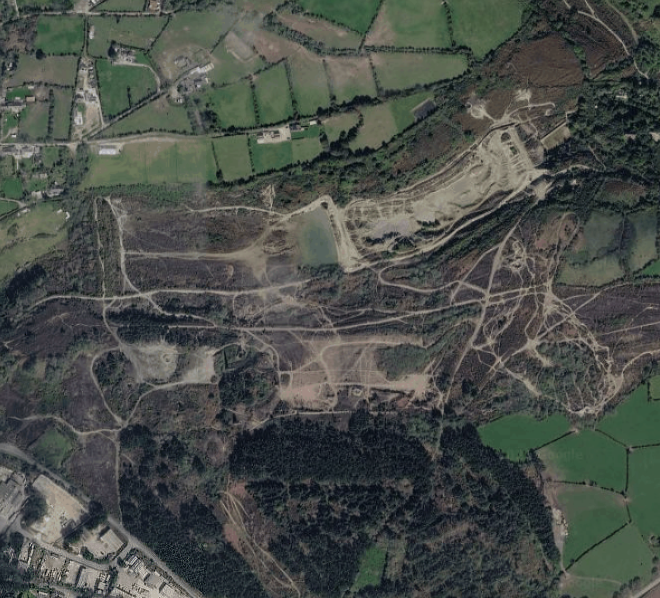

In [ ]:
bics_7 = []
aics_7 = []

n = 7

gmm = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

gmm.fit(X_pca)

# Labels
labels = gmm.predict(X_pca)

# Rebuild raster using pixel ID
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot 
fig, ax = plt.subplots(
    figsize=(8, 6),
    constrained_layout=True
)

ax.imshow(cluster_map, cmap='tab20')
ax.set_title(f"GMM Cluster Map - n={n}")
ax.axis('off')

plt.savefig(
    os.path.join(folder, f"GMM_CLUSTER_MAP_GORSE_n={n}.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()

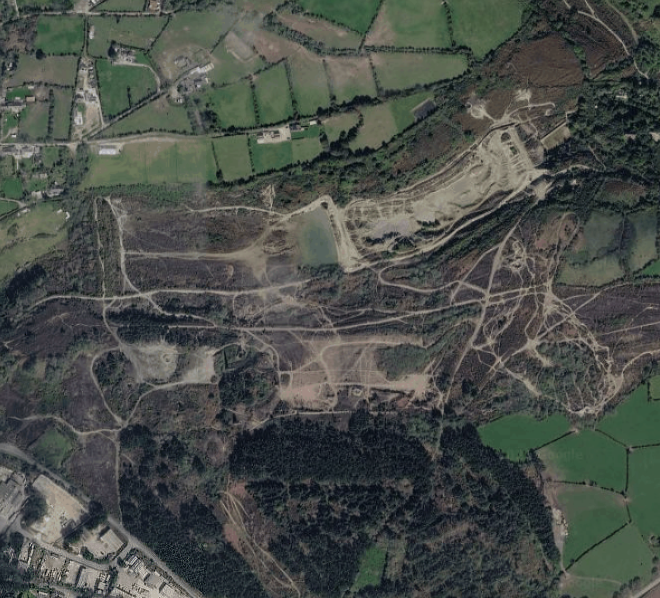

In [ ]:
bics_10 = []
aics_10 = []

n = 10

gmm = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

gmm.fit(X_pca)

# Labels
labels = gmm.predict(X_pca)

# Rebuild raster using pixel ID
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot 
fig, ax = plt.subplots(
    figsize=(8, 6),
    constrained_layout=True
)

ax.imshow(cluster_map, cmap='tab20')
ax.set_title(f"GMM Cluster Map - n={n}")
ax.axis('off')

plt.savefig(
    os.path.join(folder, f"GMM_CLUSTER_MAP_GORSE_n={n}.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()

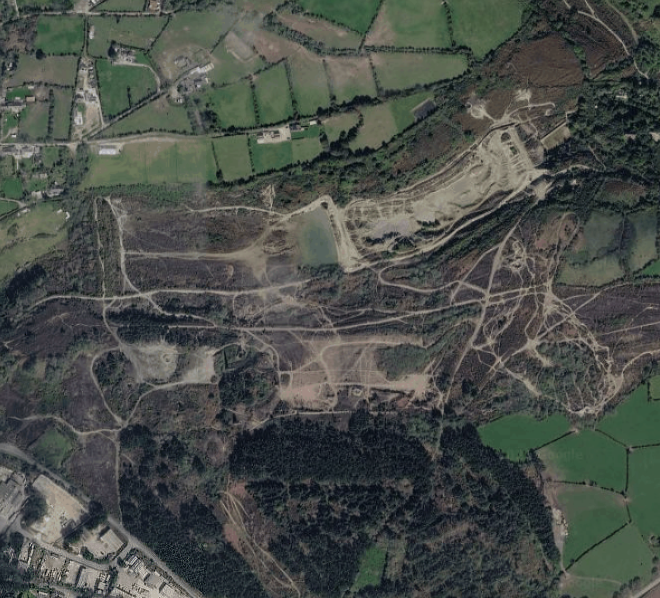

## GMM Final

Going forward am going to use n = 7 

In [ ]:
n = 7

# Fit GMM
gmm_final = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

gmm_final.fit(X_pca)

# BIC / AIC
bic_7 = gmm_final.bic(X_pca)
aic_7 = gmm_final.aic(X_pca)

print(f"BIC (n={n}): {bic_7}")
print(f"AIC (n={n}): {aic_7}")


# Predict cluster labels
labels_7 = gmm_final.predict(X_pca)

# Store labels in metadata
subset_meta['population_cluster'] = labels_7

# Rebuild raster using pixel ID
cluster_map = np.full(HEIGHT * WIDTH, np.nan)

cluster_map[subset_meta['pixel_id'].values] = labels_7

cluster_map = cluster_map.reshape(HEIGHT, WIDTH)


# Plot
fig, ax = plt.subplots(
    figsize=(8, 6),
    constrained_layout=True
)

im = ax.imshow(
    cluster_map,
    cmap='RdYlGn',
    vmin=0,
    vmax=n-1
)

# Create legend for clusters
cmap = plt.cm.get_cmap('RdYlGn', n)

handles = [
    plt.Line2D(
        [0], [0],
        marker='s',
        color='w',
        markerfacecolor=cmap(i),
        markersize=10,
        label=f'Cluster {i}'
    )
    for i in range(n)
]

ax.legend(
    handles=handles,
    title='Clusters',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)

ax.set_title(f"GMM Cluster Map - n={n}")
ax.axis('off')

plt.savefig(
    os.path.join(folder, f"GMM_CLUSTER_MAP_GORSE_n={n}.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()


## Cluster Analysis

### Cluster size and proportion

In [ ]:
subset_meta['population_cluster']

In [ ]:
subset_meta

In [ ]:
cluster_size = subset_meta['population_cluster'].value_counts()

In [ ]:
cluster_prop = subset_meta['population_cluster'].value_counts(normalize=True)

In [ ]:
cluster_stats = pd.DataFrame({
    'size': cluster_size, 
    'proportion': (cluster_prop * 100).round(2)
}) 

cluster_stats

In [ ]:
sns.barplot ( 
    x = cluster_stats.index, 
    y = cluster_stats['proportion']
) 

plt.title("Cluster Proportion") 
plt.xlabel("Cluster")
plt.ylabel("Proportion")
plt.show()

In [ ]:
cluster_stats['area_m2'] = cluster_stats['size'] * 100 
cluster_stats['area_ha'] = cluster_stats['area_m2'] / 10000

In [ ]:
cluster_stats

### What makes the clusters different?

In [ ]:
cluster_sum = ( 
    subset_meta
    .groupby('population_cluster')[veg_index]
    .agg(['mean'])
        ) 
cluster_sum

In [ ]:
plt.figure(figsize=(12, 6))

sns.heatmap(
    cluster_sum,
    cmap='GnBu',
    center=0,
    annot=True,
    fmt='.2f'
)

plt.xlabel('Vegetation Index')
plt.ylabel('Population Cluster')
plt.title('Vegetation Profiles of Population Clusters')

plt.show()

#### cluster centroid analysis

In [ ]:
cluster_centroids = (subset_meta.groupby(['year', 'population_cluster'])[veg_index]
      .mean()
)

cluster_centroids

In [ ]:
cluster_centroids['NDVI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean NDVI')
plt.title('Mean NDVI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['MARI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean MARI')
plt.title('Mean MARI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['GCI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean GCI')
plt.title('Mean GCI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['GNDVI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
        cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean GNDVI')
plt.title('Mean GNDVI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['NDMI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean NDMI')
plt.title('Mean NDMI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['NDYI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean NDYI')
plt.title('Mean NDYI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['PSRI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)


plt.xlabel('Year')
plt.ylabel('Mean PSRI')
plt.title('Mean PSRI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['RDVI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap = 'RdYlGn'
)

plt.xlabel('Year')
plt.ylabel('Mean RDVI')
plt.title('Mean RDVI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
cluster_centroids['SAVI'].unstack('population_cluster').plot(
    figsize=(10, 6),
    marker='o',
    cmap='RdYlGn'
)


plt.xlabel('Year')
plt.ylabel('Mean SAVI')
plt.title('Mean SAVI of Population Clusters Over Time')
plt.legend(title='Population Cluster')
plt.tight_layout()
plt.show()

In [ ]:
for idx in veg_index:
    plt.figure(figsize = (10,8))
    sns.boxplot(
    data = subset_meta, 
    x = ('population_cluster'), 
    y = idx 
    )

plt.title(f"{idx} distribution by cluster") 
plt.xlabel("Population Cluster")
plt.ylabel(idx)

plt.tight_layout()
plt.show

# GMM loop for years

In [ ]:
subset_meta.columns

In [ ]:
print(gmm_final.n_features_in_)

In [ ]:
X_pca

In [ ]:
subset_meta

In [ ]:
X_pca 

In [ ]:
years = sorted(subset_meta['year'].unique())

In [ ]:
years

In [ ]:
years = sorted(subset_meta['year'].unique())
n_clusters = 7

results = []
cluster_yr = {}
centroids = {}

for yr in years:

    yr = int(yr)
    df_yr = subset_meta[subset_meta['year'] == yr].copy()

    X_yr = df_yr[['PC1', 'PC2', 'PC3']].values

    gmm_yr = GaussianMixture(
        n_components=n_clusters,
        covariance_type='full',
        random_state=42
    )
    labels_yr = gmm_yr.fit_predict(X_yr)

    df_yr['Cluster'] = labels_yr
    

    centroids[yr] = (df_yr.groupby('Cluster')[['PC1', 'PC2', 'PC3']].mean())

    cluster_prop_yr = df_yr['Cluster'].value_counts(normalize=True)

    for clust, prop in cluster_prop_yr.items():
        results.append({
            'year': yr,
            'cluster': clust,
            'proportion': prop
        })

    # reshape back to raster (INSIDE LOOP)
    cluster_map_yr = np.full(HEIGHT * WIDTH, np.nan)
    cluster_map_yr[df_yr['pixel_id'].values] = labels_yr
    cluster_map_yr = cluster_map_yr.reshape(HEIGHT, WIDTH)
    cluster_yr[yr] = cluster_map_yr


# Plot (OUTSIDE LOOP, but using cluster_yr dict)
fig, axes = plt.subplots(
    nrows=len(years),
    ncols=1,
    figsize=(6, 2.5 * len(years)),
    constrained_layout=True
)

if len(years) == 1:
    axes = [axes]

for row, yr in enumerate(years):

    ax = axes[row]

    im = ax.imshow(
        cluster_yr[yr],
        cmap='RdYlGn',
        vmin=0,
        vmax=n_clusters - 1
    )

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylabel(str(yr), fontsize=10)

fig.suptitle("GMM Cluster Maps by Year for Gorse Window (n=7)", fontsize=16)


plt.savefig(
    os.path.join(folder, "GMM Cluster Maps by Year for Gorse Window n=7.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [ ]:
cluster_prop_df = pd.DataFrame(results)
cluster_prop_df

In [ ]:
plt.figure(figsize=(10,6))

sns.lineplot(
    data=cluster_prop_df,
    x='year',
    y='proportion',
    hue='cluster',
    marker='o'
)

plt.title("Cluster Proportion Change Over Time")
plt.xlabel("Year")
plt.ylabel("Proportion of Pixels")
plt.grid(True, alpha=0.3)
plt.show()


In [ ]:
cluster_size_yr = df_yr['population_cluster'].value_counts()
cluster_size_yr

In [ ]:
print(len(df_yr))
print(len(labels_yr))
print(df_yr['year'].unique())

In [ ]:
centroids

# GMM loop for PC1 and PC2 seperated

In [ ]:
loadings_df

In [ ]:
loadings_df.columns

# GMM loop for PC2 

In [ ]:
X_pc2 = loadings_df[["PC 2"]]
X_pc2

In [ ]:
years = sorted(subset_meta['year'].unique())
n_clusters = 7

results = []
cluster_yr = {}

for yr in years:

    yr = int(yr)
    df_yr = subset_meta[subset_meta['year'] == yr].copy()

    X_pc2 = df_yr[['PC2']].values

    gmm_yr = GaussianMixture(
        n_components=n_clusters,
        covariance_type='full',
        random_state=42
    )
    labels_yr = gmm_yr.fit_predict(X_pc2)

    df_yr['Cluster'] = labels_yr

    cluster_prop_yr = df_yr['Cluster'].value_counts(normalize=True)

    for clust, prop in cluster_prop_yr.items():
        results.append({
            'year': yr,
            'cluster': clust,
            'proportion': prop
        })

    # reshape back to raster (INSIDE LOOP)
    cluster_map_yr = np.full(HEIGHT * WIDTH, np.nan)
    cluster_map_yr[df_yr['pixel_id'].values] = labels_yr
    cluster_map_yr = cluster_map_yr.reshape(HEIGHT, WIDTH)

    cluster_yr[yr] = cluster_map_yr


# Plot (OUTSIDE LOOP, but using cluster_yr dict)
fig, axes = plt.subplots(
    nrows=len(years),
    ncols=1,
    figsize=(6, 2.5 * len(years)),
    constrained_layout=True
)

if len(years) == 1:
    axes = [axes]

for row, yr in enumerate(years):

    ax = axes[row]

    im = ax.imshow(
        cluster_yr[yr],
        cmap='RdYlGn',
        vmin=0,
        vmax=n_clusters - 1
    )

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylabel(str(yr), fontsize=10)

fig.suptitle("GMM PC2 Cluster Maps by Year for Gorse Window (n=7)", fontsize=16)


plt.savefig(
    os.path.join(folder, "GMM PC2 Cluster Maps by Year for Gorse Window n=7.png"),
    dpi=300,
    bbox_inches='tight'
)
plt.show()




# GMM loop for PC1

In [ ]:
years = sorted(subset_meta['year'].unique())
n_clusters = 7

results = []
cluster_yr = {}

for yr in years:

    yr = int(yr)
    df_yr = subset_meta[subset_meta['year'] == yr].copy()

    X_pc1 = df_yr[['PC1']].values

    gmm_yr = GaussianMixture(
        n_components=n_clusters,
        covariance_type='full',
        random_state=42
    )
    labels_yr = gmm_yr.fit_predict(X_pc1)

    df_yr['Cluster'] = labels_yr

    cluster_prop_yr = df_yr['Cluster'].value_counts(normalize=True)

    for clust, prop in cluster_prop_yr.items():
        results.append({
            'year': yr,
            'cluster': clust,
            'proportion': prop
        })

    # reshape back to raster (INSIDE LOOP)
    cluster_map_yr = np.full(HEIGHT * WIDTH, np.nan)
    cluster_map_yr[df_yr['pixel_id'].values] = labels_yr
    cluster_map_yr = cluster_map_yr.reshape(HEIGHT, WIDTH)

    cluster_yr[yr] = cluster_map_yr


# Plot (OUTSIDE LOOP, but using cluster_yr dict)
fig, axes = plt.subplots(
    nrows=len(years),
    ncols=1,
    figsize=(6, 2.5 * len(years)),
    constrained_layout=True
)

if len(years) == 1:
    axes = [axes]

for row, yr in enumerate(years):

    ax = axes[row]

    im = ax.imshow(
        cluster_yr[yr],
        cmap='RdYlGn',
        vmin=0,
        vmax=n_clusters - 1
    )

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylabel(str(yr), fontsize=10)

fig.suptitle("GMM PC1 Cluster Maps by Year for Gorse Window (n=7)", fontsize=16)

plt.savefig(
    os.path.join(folder, "GMM PC1 Cluster Maps by Year for Gorse Window n=7.png"),
    dpi=300,
    bbox_inches='tight'
)

plt.show()



# GMM Cluster Analysis 

In [ ]:
n = 7

# PC2 for all pixels
X_pc2 = subset_meta[['PC2']].values

# GMM
gmm_pc2 = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

labels_pc2 = gmm_pc2.fit_predict(X_pc2)

subset_meta['PC 2 Cluster ID'] = labels_pc2

# Raster
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels_pc2
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.imshow(
    cluster_map,
    cmap='RdYlGn',
    vmin=0,
    vmax=n-1
)

ax.set_title("GMM on PC2 (n=7)")
ax.axis('off')

plt.show()

cluster_sum_pc2 = (
    subset_meta
    .groupby('PC 2 Cluster ID')[veg_index]
    .agg(['mean'])
)

cluster_sum_pc2

In [ ]:
plt.figure(figsize=(12, 6))

sns.heatmap(
    cluster_sum_pc2,
    cmap='RdYlGn',
    center=0,
    annot=True,
    fmt='.2f'
)

plt.xlabel('Vegetation Index')
plt.ylabel('Population Cluster')
plt.title('Vegetation Profiles of Population Clusters for GMM pc2')

plt.show()

In [ ]:
n = 7

# PC2 for all pixels
X_pc1 = subset_meta[['PC1']].values

# GMM
gmm_pc1 = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

labels_pc1 = gmm_pc1.fit_predict(X_pc1)

subset_meta['PC 1 Cluster ID'] = labels_pc1

# Raster
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels_pc1
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.imshow(
    cluster_map,
    cmap='RdYlGn',
    vmin=0,
    vmax=n-1
)

ax.set_title("GMM on PC1 (n=7)")
ax.axis('off')

plt.show()

cluster_sum_pc1 = (
    subset_meta
    .groupby('PC 1 Cluster ID')[veg_index]
    .agg(['mean'])
)

cluster_sum_pc1

In [ ]:
plt.figure(figsize=(12, 6))

sns.heatmap(
    cluster_sum_pc1,
    cmap='RdYlGn',
    center=0,
    annot=True,
    fmt='.2f'
)

plt.xlabel('Vegetation Index')
plt.ylabel('Population Cluster')
plt.title('Vegetation Profiles of Population Clusters for GMM pc1')

plt.show()

In [ ]:
n = 7

# PC3 for all pixels
X_pc3 = subset_meta[['PC3']].values

# GMM
gmm_pc3 = GaussianMixture(
    n_components=n,
    covariance_type='full',
    random_state=42
)

labels_pc3 = gmm_pc3.fit_predict(X_pc3)

subset_meta['PC 3 Cluster ID'] = labels_pc3

# Raster
cluster_map = np.full(HEIGHT * WIDTH, np.nan)
cluster_map[subset_meta['pixel_id'].values] = labels_pc3
cluster_map = cluster_map.reshape(HEIGHT, WIDTH)

# Plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.imshow(
    cluster_map,
    cmap='RdYlGn',
    vmin=0,
    vmax=n-1
)

ax.set_title("GMM on PC3 (n=7)")
ax.axis('off')

plt.show()

cluster_sum_pc3 = (
    subset_meta
    .groupby('PC 3 Cluster ID')[veg_index]
    .agg(['mean'])
)

cluster_sum_pc3

In [ ]:
plt.figure(figsize=(12, 6))

sns.heatmap(
    cluster_sum_pc3,
    cmap='RdYlGn',
    center=0,
    annot=True,
    fmt='.2f'
)

plt.xlabel('Vegetation Index')
plt.ylabel('Population Cluster')
plt.title('Vegetation Profiles of Population Clusters for GMM pc3')

plt.show()